In [14]:
import IPython
import os
import copy
import json
import time
import torch
import argparse
import soundfile as sf
from tqdm import tqdm
from diffusers import DDPMScheduler
from audioldm_eval import EvaluationHelper
from models import build_pretrained_models, AudioDiffusion
from transformers import AutoProcessor, ClapModel
import torchaudio
from tango import Tango
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt

import numpy as np
import IPython
from IPython.display import Audio, display
import torch
import librosa, librosa.display
from tqdm.auto import tqdm, trange
import json


from accelerate.utils import set_seed

%load_ext autoreload
%autoreload 2
%reload_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
tango = Tango("declare-lab/tango-full-ft-audiocaps") #Loads the model using 12GB mem. But OOM while running inference. How much does this model need!!
# tango = Tango("declare-lab/tango")

Fetching 9 files:   0%|          | 0/9 [00:00<?, ?it/s]

/home/purnima/appdir/Github/tango/audioldm/audio/stft.py:42: FutureWarning: Pass size=1024 as keyword args. From version 0.10 passing these as positional arguments will result in an error
  fft_window = pad_center(fft_window, filter_length)
/home/purnima/appdir/Github/tango/audioldm/audio/stft.py:151: FutureWarning: Pass sr=16000, n_fft=1024, n_mels=64, fmin=0, fmax=8000 as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel_basis = librosa_mel_fn(


UNet initialized randomly.


Some weights of the model checkpoint at google/flan-t5-large were not used when initializing T5EncoderModel: ['decoder.block.11.layer.2.layer_norm.weight', 'decoder.block.2.layer.0.layer_norm.weight', 'decoder.block.13.layer.0.SelfAttention.v.weight', 'decoder.block.2.layer.1.layer_norm.weight', 'decoder.block.5.layer.1.EncDecAttention.q.weight', 'decoder.block.16.layer.2.DenseReluDense.wo.weight', 'decoder.block.8.layer.0.SelfAttention.q.weight', 'decoder.block.0.layer.1.EncDecAttention.k.weight', 'decoder.block.19.layer.1.EncDecAttention.q.weight', 'decoder.block.1.layer.0.layer_norm.weight', 'decoder.block.11.layer.2.DenseReluDense.wo.weight', 'decoder.block.20.layer.0.SelfAttention.o.weight', 'decoder.block.12.layer.2.DenseReluDense.wi_0.weight', 'decoder.block.3.layer.2.DenseReluDense.wi_1.weight', 'decoder.block.1.layer.1.layer_norm.weight', 'decoder.block.20.layer.2.DenseReluDense.wo.weight', 'decoder.block.11.layer.2.DenseReluDense.wi_1.weight', 'decoder.block.19.layer.0.SelfAt

Successfully loaded checkpoint from: declare-lab/tango-full-ft-audiocaps


In [7]:
sample_rate=16000
guidance_scale = 3
random_seed = 43
diffusion_steps = 20

In [8]:
def plot(waveform, predicted_noise, predicted_uncond_noise):
    epsilon_noise = noise_to_mel_to_wave(predicted_noise)
    epsilon_noise_uncond = noise_to_mel_to_wave(predicted_uncond_noise)
    
    IPython.display.display(IPython.display.Audio(waveform[0][0], rate=16000))
    IPython.display.display(IPython.display.Audio(epsilon_noise[0][0], rate=16000))
    IPython.display.display(IPython.display.Audio(epsilon_noise_uncond[0][0], rate=16000))
    
    %matplotlib inline
    
    fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(15,5))
    
    D = librosa.amplitude_to_db(np.abs(librosa.stft(waveform[0][0], hop_length=512)),ref=np.max)
    librosa.display.specshow(D, y_axis='linear', sr=16000, hop_length=512, x_axis='time', ax=axs[0])
    
    D = librosa.amplitude_to_db(np.abs(librosa.stft(epsilon_noise[0][0], hop_length=512)),ref=np.max)
    librosa.display.specshow(D, y_axis='linear', sr=16000, hop_length=512, x_axis='time', ax=axs[1])
    
    D = librosa.amplitude_to_db(np.abs(librosa.stft(epsilon_noise_uncond[0][0], hop_length=512)),ref=np.max)
    librosa.display.specshow(D, y_axis='linear', sr=16000, hop_length=512, x_axis='time', ax=axs[2])
    
    torch.norm(predicted_noise), torch.norm(predicted_uncond_noise)

def plot_wavs(wav1, wav2):
    IPython.display.display(IPython.display.Audio(wav1[0][0], rate=16000))
    IPython.display.display(IPython.display.Audio(wav2[0][0], rate=16000))

    %matplotlib inline
    
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15,5))
    
    D = librosa.amplitude_to_db(np.abs(librosa.stft(wav1[0][0], hop_length=512)),ref=np.max)
    librosa.display.specshow(D, y_axis='linear', sr=16000, hop_length=512, x_axis='time', ax=axs[0])
    axs[0].set_title('wav1') 
    
    D = librosa.amplitude_to_db(np.abs(librosa.stft(wav2[0][0], hop_length=512)),ref=np.max)
    librosa.display.specshow(D, y_axis='linear', sr=16000, hop_length=512, x_axis='time', ax=axs[1])
    axs[1].set_title('wav2') 

def plot_all(wavs):
    %matplotlib inline
    nrows = len(wavs)//4 
    if len(wavs)%4 > 0:
        nrows += 1
    print('num rows=', nrows)
    fig, axs = plt.subplots(nrows=nrows, ncols=4, figsize=(15,5))
    for i, wav in enumerate(wavs):
        nrow = i//4
        ncol = i%4
        IPython.display.display(IPython.display.Audio(wav, rate=16000))

        D = librosa.amplitude_to_db(np.abs(librosa.stft(wav, hop_length=512)),ref=np.max)
        if nrows>1:
            librosa.display.specshow(D, y_axis='linear', sr=16000, hop_length=512, x_axis='time', ax=axs[nrow][ncol])
        else:
            librosa.display.specshow(D, y_axis='linear', sr=16000, hop_length=512, x_axis='time', ax=axs[ncol])

def noise_to_mel_to_wave(predicted_noise):
    mel = latent_diffusion.decode_first_stage(predicted_noise)
    waveform = latent_diffusion.mel_spectrogram_to_waveform(
        mel, savepath="", bs=None, name="somename", save=False
    )
    return waveform

In [9]:
def get_tokens(text):
    batch = tango.model.tokenizer(
        text, max_length=tango.model.tokenizer.model_max_length, padding=True, truncation=True, return_tensors="pt"
    )
    word_list = tango.model.tokenizer.convert_ids_to_tokens(batch.input_ids[0])
    for ind, id in enumerate(batch.input_ids[0]):
        print(ind, word_list[ind], '==>', id)

    return len(word_list)
    

In [15]:
def generate(prompt, steps, seed, disable_progress, attention_weights):
    set_seed(seed)
    wav = tango.generate(prompt=prompt, steps=steps, disable_progress=disable_progress, \
                         attention_weights=attention_weights).astype(np.float16)
    return wav

In [25]:
text = "A drumstick is continuously hitting a hard metal surface with reverb"
count = get_tokens(text)

0 ▁A ==> tensor(71)
1 ▁drum ==> tensor(5253)
2 stick ==> tensor(9656)
3 ▁is ==> tensor(19)
4 ▁continuously ==> tensor(11721)
5 ▁hitting ==> tensor(10849)
6 ▁ ==> tensor(3)
7 a ==> tensor(9)
8 ▁hard ==> tensor(614)
9 ▁metal ==> tensor(1946)
10 ▁surface ==> tensor(1774)
11 ▁with ==> tensor(28)
12 ▁ ==> tensor(3)
13 re ==> tensor(60)
14 verb ==> tensor(11868)
15 </s> ==> tensor(1)


tensor([ 1,  1,  1,  1,  1,  1,  1,  1,  1, -3,  1,  1,  1,  1,  1,  1],
       device='cuda:0')


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:05<00:00,  8.54it/s]


tensor([ 1,  1,  1,  1,  1,  1,  1,  1,  1, -2,  1,  1,  1,  1,  1,  1],
       device='cuda:0')


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:05<00:00,  8.51it/s]


tensor([ 1,  1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1,  1,  1,  1],
       device='cuda:0')


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:05<00:00,  8.52it/s]


tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1], device='cuda:0')


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:05<00:00,  8.51it/s]


tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:05<00:00,  8.50it/s]


tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1], device='cuda:0')


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:05<00:00,  8.45it/s]


num rows= 2


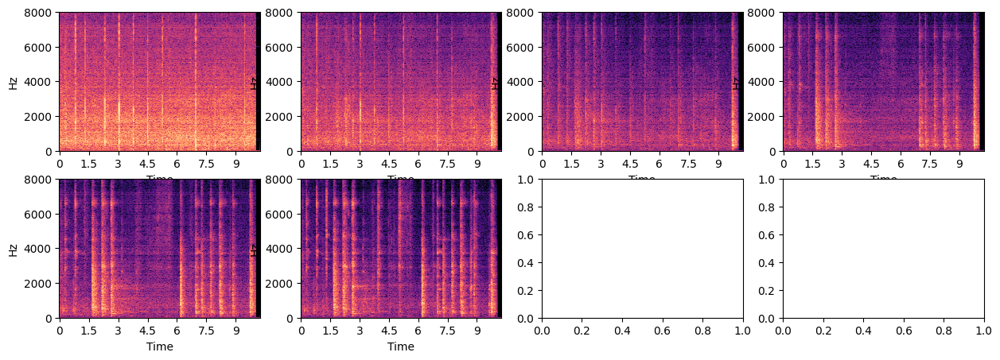

In [26]:
# attention_weights = None
attention_weights = torch.from_numpy(np.array([1 for i in range(count)])).cuda()

wavs = []

interp_range = [i for i in np.arange(-3, 3, 1)]
for attention_weight in interp_range:
    # attention_weights[8] = attention_weight
    attention_weights[9] = attention_weight
    print(attention_weights)

    wav = generate(prompt=text, steps=50, disable_progress=False, attention_weights=attention_weights, seed=1943)
    # wav = tango.generate(prompt=text, steps=50, disable_progress=False, attention_weights=attention_weights).astype(np.float16)
    
    wavs.append(wav)
    
plot_all(wavs)

In [32]:
text = "The sound of water filling an empty container"
count = get_tokens(text)

0 ▁The ==> tensor(37)
1 ▁sound ==> tensor(1345)
2 ▁of ==> tensor(13)
3 ▁water ==> tensor(387)
4 ▁fill ==> tensor(14)
5 ing ==> tensor(53)
6 ▁an ==> tensor(46)
7 ▁empty ==> tensor(6364)
8 ▁container ==> tensor(6295)
9 </s> ==> tensor(1)


tensor([ 1,  1,  1,  1, -4, -4,  1,  1,  1,  1], device='cuda:0')


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:05<00:00,  8.63it/s]


tensor([ 1,  1,  1,  1, -3, -3,  1,  1,  1,  1], device='cuda:0')


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:05<00:00,  8.56it/s]


tensor([ 1,  1,  1,  1, -2, -2,  1,  1,  1,  1], device='cuda:0')


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:05<00:00,  8.52it/s]


tensor([ 1,  1,  1,  1, -1, -1,  1,  1,  1,  1], device='cuda:0')


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:05<00:00,  8.51it/s]


tensor([1, 1, 1, 1, 0, 0, 1, 1, 1, 1], device='cuda:0')


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:05<00:00,  8.48it/s]


tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:05<00:00,  8.49it/s]


tensor([1, 1, 1, 1, 2, 2, 1, 1, 1, 1], device='cuda:0')


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:05<00:00,  8.47it/s]


tensor([1, 1, 1, 1, 3, 3, 1, 1, 1, 1], device='cuda:0')


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:05<00:00,  8.48it/s]


num rows= 2


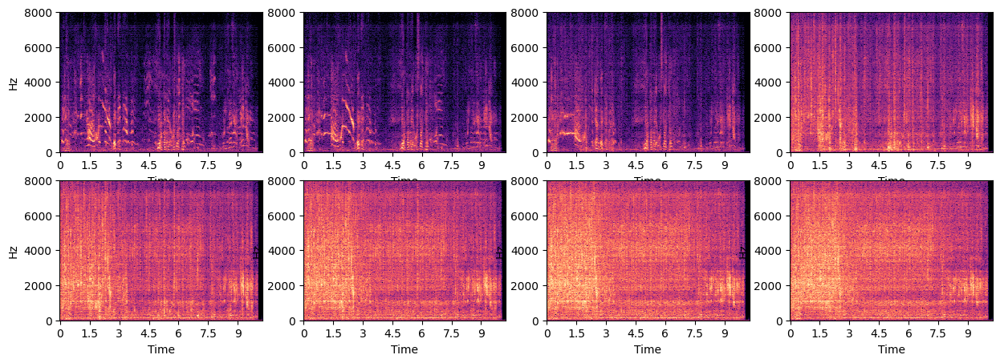

In [33]:
# attention_weights = None
attention_weights = torch.from_numpy(np.array([1 for i in range(count)])).cuda()

wavs = []

interp_range = [i for i in np.arange(-4, 4, 1)]
for attention_weight in interp_range:
    attention_weights[4] = attention_weight
    attention_weights[5] = attention_weight
    print(attention_weights)

    wav = generate(prompt=text, steps=50, disable_progress=False, attention_weights=attention_weights, seed=42)
    #wav = tango.generate(prompt=text, steps=50, disable_progress=False, attention_weights=attention_weights).astype(np.float16)
    
    wavs.append(wav)
    
plot_all(wavs)

In [29]:
text = "The sound of wind blowing"
count = get_tokens(text)

0 ▁The ==> tensor(37)
1 ▁sound ==> tensor(1345)
2 ▁of ==> tensor(13)
3 ▁wind ==> tensor(2943)
4 ▁blow ==> tensor(6019)
5 ing ==> tensor(53)
6 </s> ==> tensor(1)


tensor([ 1,  1,  1,  1, -4, -4,  1], device='cuda:0')


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:05<00:00,  8.36it/s]


tensor([ 1,  1,  1,  1, -3, -3,  1], device='cuda:0')


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:05<00:00,  8.40it/s]


tensor([ 1,  1,  1,  1, -2, -2,  1], device='cuda:0')


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:05<00:00,  8.43it/s]


tensor([ 1,  1,  1,  1, -1, -1,  1], device='cuda:0')


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:05<00:00,  8.41it/s]


tensor([1, 1, 1, 1, 0, 0, 1], device='cuda:0')


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:05<00:00,  8.43it/s]


tensor([1, 1, 1, 1, 1, 1, 1], device='cuda:0')


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:05<00:00,  8.41it/s]


tensor([1, 1, 1, 1, 2, 2, 1], device='cuda:0')


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:05<00:00,  8.41it/s]


tensor([1, 1, 1, 1, 3, 3, 1], device='cuda:0')


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:05<00:00,  8.40it/s]


num rows= 2


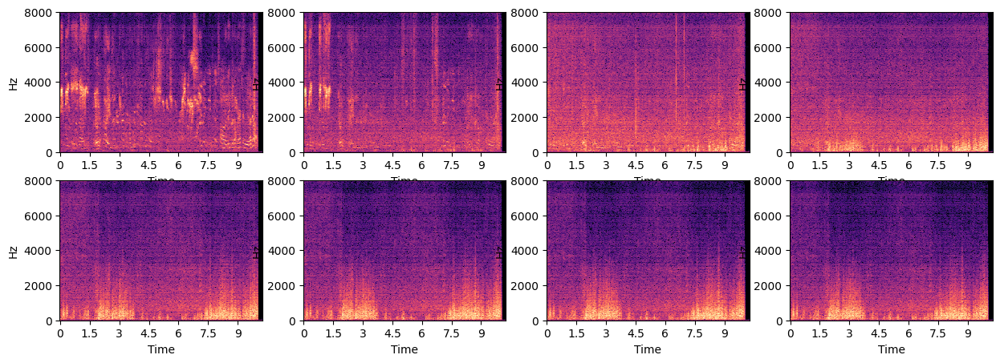

In [30]:
# attention_weights = None
attention_weights = torch.from_numpy(np.array([1 for i in range(count)])).cuda()

wavs = []

interp_range = [i for i in np.arange(-4, 4, 1)]
for attention_weight in interp_range:
    attention_weights[4] = attention_weight
    attention_weights[5] = attention_weight
    print(attention_weights)

    #wav = tango.generate(prompt=text, steps=50, disable_progress=False, attention_weights=attention_weights).astype(np.float16)
    wav = generate(prompt=text, steps=50, disable_progress=False, attention_weights=attention_weights, seed=1943)
    
    wavs.append(wav)
    
plot_all(wavs)

In [21]:
text = "A dog barking in a large room with reverb"
count = get_tokens(text)

0 ▁A ==> tensor(71)
1 ▁dog ==> tensor(1782)
2 ▁bark ==> tensor(21696)
3 ing ==> tensor(53)
4 ▁in ==> tensor(16)
5 ▁ ==> tensor(3)
6 a ==> tensor(9)
7 ▁large ==> tensor(508)
8 ▁room ==> tensor(562)
9 ▁with ==> tensor(28)
10 ▁ ==> tensor(3)
11 re ==> tensor(60)
12 verb ==> tensor(11868)
13 </s> ==> tensor(1)


tensor([ 1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -4, -4,  1],
       device='cuda:0')


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:05<00:00,  8.69it/s]


tensor([ 1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -3, -3,  1],
       device='cuda:0')


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:05<00:00,  8.68it/s]


tensor([ 1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -2, -2,  1],
       device='cuda:0')


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:05<00:00,  8.65it/s]


tensor([ 1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -1, -1,  1],
       device='cuda:0')


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:05<00:00,  8.63it/s]


tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1], device='cuda:0')


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:05<00:00,  8.60it/s]


tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:05<00:00,  8.59it/s]


tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1], device='cuda:0')


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:05<00:00,  8.55it/s]


tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 3, 1], device='cuda:0')


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:05<00:00,  8.50it/s]


num rows= 2


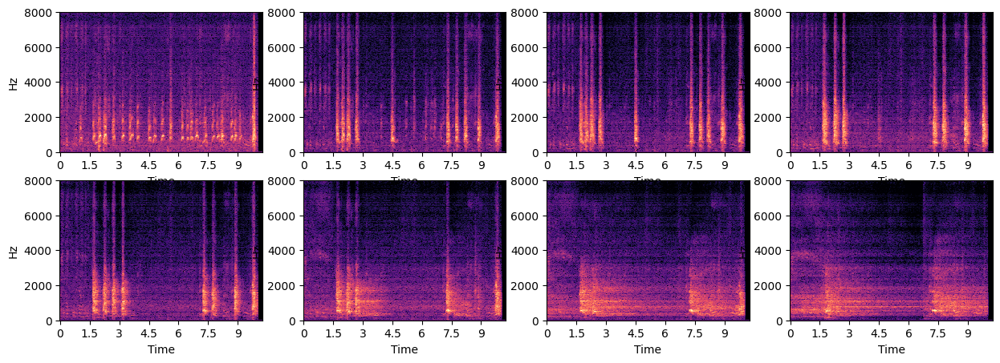

In [23]:
# attention_weights = None
attention_weights = torch.from_numpy(np.array([1 for i in range(count)])).cuda()

wavs = []

interp_range = [i for i in np.arange(-4, 4, 1)]
for attention_weight in interp_range:
    attention_weights[11] = attention_weight
    attention_weights[12] = attention_weight
    print(attention_weights)

    wav = generate(prompt=text, steps=50, disable_progress=False, attention_weights=attention_weights, seed=1943)
    
    wavs.append(wav)
    
plot_all(wavs)